<a href="https://colab.research.google.com/github/PatelHarshitt/ComputerVision2026-CapsularEndoscopy/blob/main/testing_galar_dataste_on_model_from_kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls /content/drive/MyDrive

 account.pdf					 RARE_VISION_2026
 Classroom					 sal.pdf
'Colab Notebooks'				'Untitled document.gdoc'
 Communication_project.gslides			 VID-20240223-WA0108.mp4
 datasets					 VID-20240223-WA0117.mp4
'Deep Learning for CPFSK Demodulation.gslides'	 VID-20240224-WA0201.mp4
'Detailed Project Walkthrough'			 VID-20240224-WA0202.mp4
 fee.pdf					 VID-20240224-WA0203.mp4
 Galar_labels_and_metadata			 VID-20240224-WA0204.mp4
 psal.pdf					'Vis Dataset'
'QUESTION 4.gdoc'				'VISION Dataset'


In [3]:
!ls "/content/drive/MyDrive/Vis Dataset"

61  62	63  64	65  66	67  68	69  70


In [ ]:
!ls /content

drive  gi_model.pth  sample_data


In [ ]:
!unzip gi_model.pth.zip

unzip:  cannot find or open gi_model.pth.zip, gi_model.pth.zip.zip or gi_model.pth.zip.ZIP.


In [ ]:
!ls /content

drive  gi_model.pth  sample_data


In [4]:
import torch
import timm
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

model = timm.create_model("efficientnet_b2", pretrained=False)
model.classifier = nn.Linear(model.classifier.in_features, 23)

model.load_state_dict(torch.load("/content/gi_model.pth", map_location=device))
model = model.to(device)
model.eval()

print("Model loaded")

Model loaded


In [5]:
from PIL import Image
import torchvision.transforms as transforms

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

In [6]:
import os

In [7]:
base_path = "/content/drive/MyDrive/Vis Dataset"

patients = sorted(os.listdir(base_path))
print(patients)

['61', '62', '63', '64', '65', '66', '67', '68', '69', '70']


In [8]:
import torch.nn.functional as F
import os

classes = [
'barretts','barretts-short-segment','bbps-0-1','bbps-2-3','cecum',
'dyed-lifted-polyps','dyed-resection-margins','esophagitis-a',
'esophagitis-b-d','hemorrhoids','ileum','impacted-stool','polyps',
'pylorus','retroflex-rectum','retroflex-stomach',
'ulcerative-colitis-grade-0-1','ulcerative-colitis-grade-1',
'ulcerative-colitis-grade-1-2','ulcerative-colitis-grade-2',
'ulcerative-colitis-grade-2-3','ulcerative-colitis-grade-3','z-line'
]

for patient in patients:

    folder = os.path.join(base_path, patient)
    images = os.listdir(folder)[:10]   # first 10 frames only

    print("\nPATIENT:", patient)

    for img_name in images:
        path = os.path.join(folder, img_name)

        img = Image.open(path).convert("RGB")
        img = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            out = model(img)
            prob = F.softmax(out,1)
            pred = prob.argmax(1).item()
            conf = prob[0][pred].item()

        print(img_name,"→",classes[pred],f"({conf:.2f})")


PATIENT: 61
frame_043010.PNG → cecum (0.18)
frame_043015.PNG → bbps-0-1 (0.24)
frame_043020.PNG → bbps-0-1 (0.42)
frame_043025.PNG → dyed-lifted-polyps (0.30)
frame_043030.PNG → bbps-0-1 (0.35)
frame_043035.PNG → bbps-0-1 (0.40)
frame_043040.PNG → bbps-0-1 (0.41)
frame_043045.PNG → dyed-lifted-polyps (0.57)
frame_043050.PNG → bbps-0-1 (0.61)
frame_043055.PNG → dyed-lifted-polyps (0.26)

PATIENT: 62
frame_018025.PNG → bbps-0-1 (0.37)
frame_018030.PNG → bbps-0-1 (0.68)
frame_018035.PNG → polyps (0.20)
frame_018040.PNG → bbps-0-1 (0.17)
frame_018045.PNG → cecum (0.34)
frame_018050.PNG → dyed-resection-margins (0.20)
frame_018055.PNG → polyps (0.55)
frame_018060.PNG → polyps (0.42)
frame_018065.PNG → dyed-lifted-polyps (0.18)
frame_018070.PNG → polyps (0.30)

PATIENT: 63
frame_038045.PNG → dyed-resection-margins (0.14)
frame_038050.PNG → bbps-0-1 (0.43)
frame_038055.PNG → bbps-0-1 (0.26)
frame_038060.PNG → dyed-lifted-polyps (0.24)
frame_038065.PNG → bbps-0-1 (0.41)
frame_038070.PNG → bbp

In [9]:
csvloc= '/content/drive/MyDrive/Galar_labels_and_metadata/Labels'

In [10]:
import pandas as pd
import os

csvloc = "/content/drive/MyDrive/Galar_labels_and_metadata/Labels"

files = sorted(os.listdir(csvloc))
print(files[:])

['1.csv', '10.csv', '11.csv', '12.csv', '13.csv', '14.csv', '15.csv', '16.csv', '17.csv', '18.csv', '19.csv', '2.csv', '20.csv', '21.csv', '22.csv', '23.csv', '24.csv', '25.csv', '26.csv', '27.csv', '28.csv', '29.csv', '3.csv', '30.csv', '31.csv', '32.csv', '33.csv', '34.csv', '35.csv', '36.csv', '37.csv', '38.csv', '39.csv', '4.csv', '40.csv', '41.csv', '42.csv', '43.csv', '44.csv', '45.csv', '46.csv', '47.csv', '48.csv', '49.csv', '5.csv', '50.csv', '51.csv', '52.csv', '53.csv', '54.csv', '55.csv', '56.csv', '57.csv', '58.csv', '59.csv', '6.csv', '60.csv', '61.csv', '62.csv', '63.csv', '64.csv', '65.csv', '66.csv', '67.csv', '68.csv', '69.csv', '7.csv', '70.csv', '71.csv', '72.csv', '73.csv', '74.csv', '75.csv', '76.csv', '77.csv', '78.csv', '79.csv', '8.csv', '80.csv', '9.csv']


In [11]:
import pandas as pd

csvloc = "/content/drive/MyDrive/Galar_labels_and_metadata/Labels"

df = pd.read_csv(f"{csvloc}/61.csv")

print(df.head())
print(df.columns)

   index  z-line  pylorus  ampulla of vater  ileocecal valve    section  \
0      0       0        0                 0                0      mouth   
1      1       0        0                 0                0      mouth   
2      2       0        0                 0                0  esophagus   
3      3       0        0                 0                0  esophagus   
4      4       0        0                 0                0  esophagus   

   mouth  esophagus  stomach  small intestine  ...  angiectasia  IBD  \
0      1          0        0                0  ...            0    0   
1      1          0        0                0  ...            0    0   
2      0          1        0                0  ...            0    0   
3      0          1        0                0  ...            0    0   
4      0          1        0                0  ...            0    0   

   foreign body  esophagitis  varices  hematin  celiac  cancer  \
0             0            0        0        0    

In [12]:
abnormal_classes = [
'polyps',
'ulcerative-colitis-grade-0-1',
'ulcerative-colitis-grade-1',
'ulcerative-colitis-grade-1-2',
'ulcerative-colitis-grade-2',
'ulcerative-colitis-grade-2-3',
'ulcerative-colitis-grade-3',
'hemorrhoids',
'barretts',
'barretts-short-segment',
'esophagitis-a',
'esophagitis-b-d'
]

In [13]:
import torch.nn.functional as F
import matplotlib.pyplot as plt


for patient in patients:

    print("\n====================")
    print("PATIENT:", patient)

    folder = os.path.join(base_path, patient)
    images = os.listdir(folder)

    abnormal_frames = {}

    for img_name in images:

        path = os.path.join(folder,img_name)

        img = Image.open(path).convert("RGB")
        img_t = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            out = model(img_t)
            prob = F.softmax(out,1)
            pred = prob.argmax(1).item()
            conf = prob[0][pred].item()

        label = classes[pred]

        # only store abnormal findings
        if label in abnormal_classes:

            # keep highest confidence frame for each abnormal class
            if label not in abnormal_frames or conf > abnormal_frames[label][1]:
                abnormal_frames[label] = (path, conf)

    # display results
    if len(abnormal_frames) == 0:
        print("No abnormality detected")

    else:
        print("Detected abnormalities:\n")

        for label,(path,conf) in abnormal_frames.items():

            img = Image.open(path)

            plt.figure(figsize=(3,3))
            plt.imshow(img)
            plt.title(f"{label} ({conf:.2f})")
            plt.axis("off")


PATIENT: 61


KeyboardInterrupt: 

In [14]:
!pip install reportlab -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 85.7 MB/s eta 0:00:00


Enter patient number (example: 61): 62

Analyzing patient: 62
Processed 32 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 64 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 96 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 128 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 160 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 192 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 224 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 256 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 288 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 320 / 4604

Detected a

/tmp/ipython-input-1283871774.py:123: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(3,3))



PDF saved at: /content/reports/patient_62_report.pdf
Processed 704 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 736 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 768 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 800 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 832 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 864 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 896 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 928 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 960 / 4604

Detected abnormalities:


PDF saved at: /content/reports/patient_62_report.pdf
Processed 992 / 4604

Detected abnorm

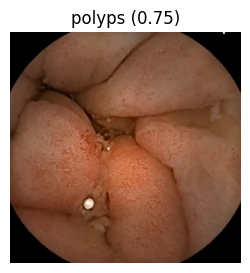

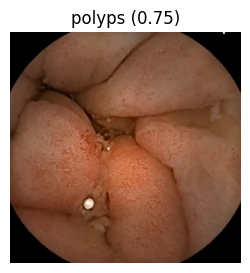

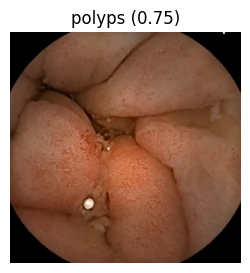

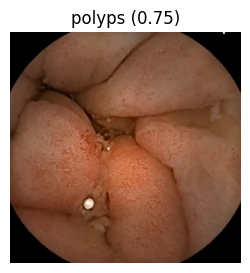

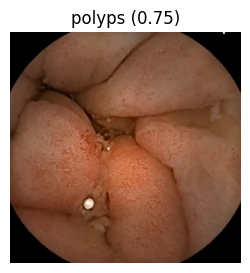

...

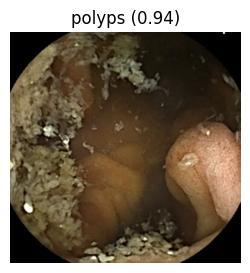

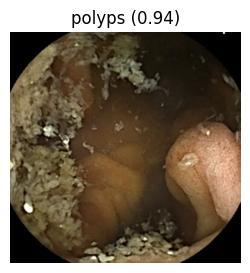

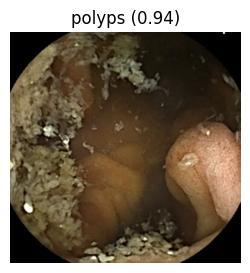

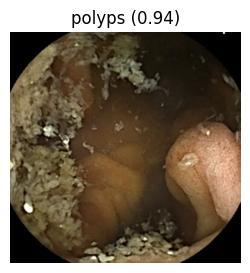

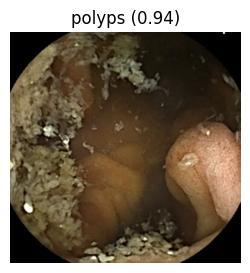

In [15]:
import os
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
from reportlab.platypus import SimpleDocTemplate, Paragraph, Image as PDFImage, Spacer
from reportlab.lib.pagesizes import letter
from reportlab.lib.styles import getSampleStyleSheet

# ======================
# SETTINGS
# ======================

confidence_threshold = 0.70

base_path = "/content/drive/MyDrive/Vis Dataset"
report_folder = "/content/reports"
os.makedirs(report_folder, exist_ok=True)


# ======================
# SELECT PATIENT
# ======================

patient = input("Enter patient number (example: 61): ").strip()
folder = os.path.join(base_path, patient)

if not os.path.exists(folder):
    print("Patient folder not found.")
else:

    print("\nAnalyzing patient:", patient)

    # only image files
    images = [f for f in os.listdir(folder) if f.lower().endswith((".png",".jpg",".jpeg"))]

    abnormal_frames = {}

    # ======================
    # PREDICTION LOOP
    # ======================

    # for img_name in images:

    #     try:
    #         path = os.path.join(folder,img_name)
    #         img = Image.open(path).convert("RGB")
    #     except:
    #         continue

    #     img_t = transform(img).unsqueeze(0).to(device)

    #     with torch.no_grad():
    #         out = model(img_t)
    #         prob = F.softmax(out,1)
    #         pred = prob.argmax(1).item()
    #         conf = prob[0][pred].item()

    #     label = classes[pred]

    #     # keep only abnormal detections above threshold
    #     if label in abnormal_classes and conf > confidence_threshold:

    #         if label not in abnormal_frames or conf > abnormal_frames[label][1]:
    #             abnormal_frames[label] = (path, conf)
    batch_size = 32
abnormal_frames = {}

for start in range(0, len(images), batch_size):

    batch_files = images[start:start+batch_size]
    batch_imgs = []
    batch_paths = []

    for img_name in batch_files:
        try:
            path = os.path.join(folder,img_name)
            img = Image.open(path).convert("RGB")
            batch_imgs.append(transform(img))
            batch_paths.append(path)
        except:
            continue

    if len(batch_imgs) == 0:
        continue

    batch_tensor = torch.stack(batch_imgs).to(device)

    with torch.no_grad():
        outputs = model(batch_tensor)
        probs = F.softmax(outputs,1)

    for i in range(len(batch_paths)):

        conf, pred = torch.max(probs[i],0)
        label = classes[pred.item()]
        conf = conf.item()
        path = batch_paths[i]

        if label in abnormal_classes and conf > confidence_threshold:

            if label not in abnormal_frames or conf > abnormal_frames[label][1]:
                abnormal_frames[label] = (path, conf)

    print("Processed", min(start+batch_size,len(images)), "/", len(images))

    # ======================
    # DISPLAY RESULTS
    # ======================

    print("\n====================")

    if len(abnormal_frames) == 0:
        print("No abnormality detected")

    else:
        print("Detected abnormalities:\n")

        for label,(path,conf) in abnormal_frames.items():

            img = Image.open(path)

            plt.figure(figsize=(3,3))
            plt.imshow(img)
            plt.title(f"{label} ({conf:.2f})")
            plt.axis("off")

    # ======================
    # GENERATE PDF REPORT
    # ======================

    pdf_path = f"{report_folder}/patient_{patient}_report.pdf"
    doc = SimpleDocTemplate(pdf_path, pagesize=letter)

    styles = getSampleStyleSheet()
    elements = []

    elements.append(Paragraph(f"Patient {patient} Diagnostic Report", styles["Title"]))
    elements.append(Spacer(1, 12))

    if len(abnormal_frames) == 0:
        elements.append(Paragraph("No abnormality detected.", styles["Normal"]))

    else:
        for label,(path,conf) in abnormal_frames.items():

            elements.append(Paragraph(f"{label} (confidence {conf:.2f})", styles["Heading3"]))
            elements.append(PDFImage(path, width=200, height=200))
            elements.append(Spacer(1, 12))

    doc.build(elements)

    print("\nPDF saved at:", pdf_path)